# Data Preprocessing

### Downloading Data

In [30]:
import os
import time
import math
import json
import torch
import shutil
import random
import kagglehub
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
from collections import defaultdict
import matplotlib.patches as patches
from concurrent.futures import ThreadPoolExecutor, as_completed

In [10]:
orvile_p_vivax_malaria_infected_human_blood_smears_path = kagglehub.dataset_download('orvile/p-vivax-malaria-infected-human-blood-smears')
print('Data import complete.')

Data import complete.


In [11]:
print(orvile_p_vivax_malaria_infected_human_blood_smears_path)

C:\Users\shera\.cache\kagglehub\datasets\orvile\p-vivax-malaria-infected-human-blood-smears\versions\1


In [12]:
# Destination path
destination_path = 'dataset'
# Create destination folder if doesn't exist
os.makedirs(destination_path, exist_ok=True)
# Copying dataset to folder
shutil.copytree(orvile_p_vivax_malaria_infected_human_blood_smears_path, destination_path, dirs_exist_ok=True)

'dataset'

### Getting Downloaded Data

In [5]:
# Paths
root_path = os.path.join('dataset', 'malaria')
train_json_path = os.path.join(root_path, 'training.json')
test_json_path = os.path.join(root_path, 'test.json')
image_path = os.path.join(root_path, 'images')

In [3]:
def read_filenames_from_json(json_path):
    """
        Reading images with JSON file.
    """
    filenames = []
    try:
        with open(json_path, 'r') as f:
            data = json.load(f)
            print('Number of images are: ', len(data))
            print(data[1])
            print('Image is dictionary is :', data[1]['image'])
            print('Cells in image are :', data[1]['objects'])

    except FileNotFoundError:
        print(f"Error: The file '{json_path}' was not found.")
    except json.JSONDecodeError:
        print(f"Error: Could not decode JSON from '{json_path}'.")
    except Exception as e:
        print(f"An unexpected error occurred: {e}")

    return filenames

In [8]:
print("Train images")
read_filenames_from_json(train_json_path)
print("Test images")
read_filenames_from_json(test_json_path)

Train images
Number of images are:  1208
{'image': {'checksum': '1225a18efce159eddf7b0e80e0ea642c', 'pathname': '/images/10be6380-cbbb-4886-8b9e-ff56b1710576.png', 'shape': {'r': 1200, 'c': 1600, 'channels': 3}}, 'objects': [{'bounding_box': {'minimum': {'r': 734, 'c': 735}, 'maximum': {'r': 832, 'c': 834}}, 'category': 'red blood cell'}, {'bounding_box': {'minimum': {'r': 939, 'c': 1283}, 'maximum': {'r': 1039, 'c': 1378}}, 'category': 'red blood cell'}, {'bounding_box': {'minimum': {'r': 367, 'c': 1134}, 'maximum': {'r': 476, 'c': 1235}}, 'category': 'red blood cell'}, {'bounding_box': {'minimum': {'r': 307, 'c': 766}, 'maximum': {'r': 400, 'c': 864}}, 'category': 'red blood cell'}, {'bounding_box': {'minimum': {'r': 596, 'c': 1463}, 'maximum': {'r': 701, 'c': 1556}}, 'category': 'red blood cell'}, {'bounding_box': {'minimum': {'r': 546, 'c': 1223}, 'maximum': {'r': 653, 'c': 1320}}, 'category': 'red blood cell'}, {'bounding_box': {'minimum': {'r': 87, 'c': 56}, 'maximum': {'r': 190,

[]

In [19]:
def ploting_cells_count(dataset_json, dataset_name):
  # Loading the JSON
  with open(dataset_json, 'r') as f:
      dataset_metadata = json.load(f)

  # Extracting all object categories into a list
  all_categories = []
  for item in dataset_metadata:
      for obj in item['objects']:
          all_categories.append(obj['category'])

  df = pd.DataFrame(all_categories, columns=['category'])

  # --- Plotting ---
  plt.figure(figsize=(12, 8))
  ax = sns.countplot(y='category', data=df, order=df['category'].value_counts().index)
  plt.title('Class Distribution in the '+dataset_name+' Dataset', fontsize=16)
  plt.xlabel('Number of Instances', fontsize=12)
  plt.ylabel('Cell Category', fontsize=12)
  # Use a log scale for the x-axis due to the large imbalance
  plt.xscale('log')

  for p in ax.patches:
      width = p.get_width()
      y = p.get_y() + p.get_height() / 2

      # Adding the text to the plot
      ax.text(width + 1,  # Positioning the text slightly to the right of the bar
              y,
              f'{int(width)}', # Displaying count
              ha='left',      # Horizontal alignment
              va='center')    # Vertical alignment
  plt.show()

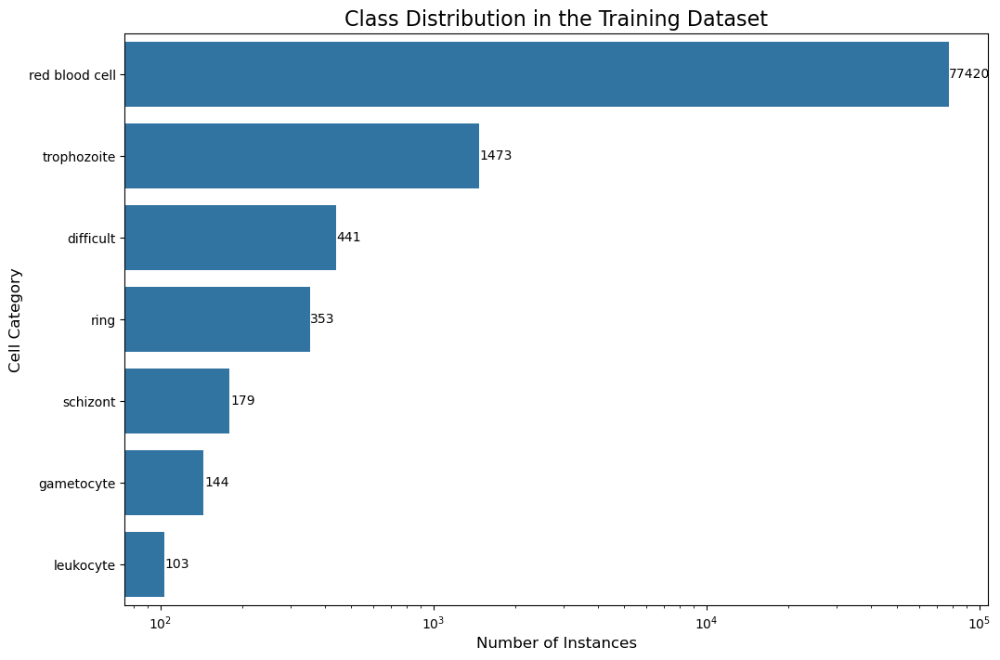

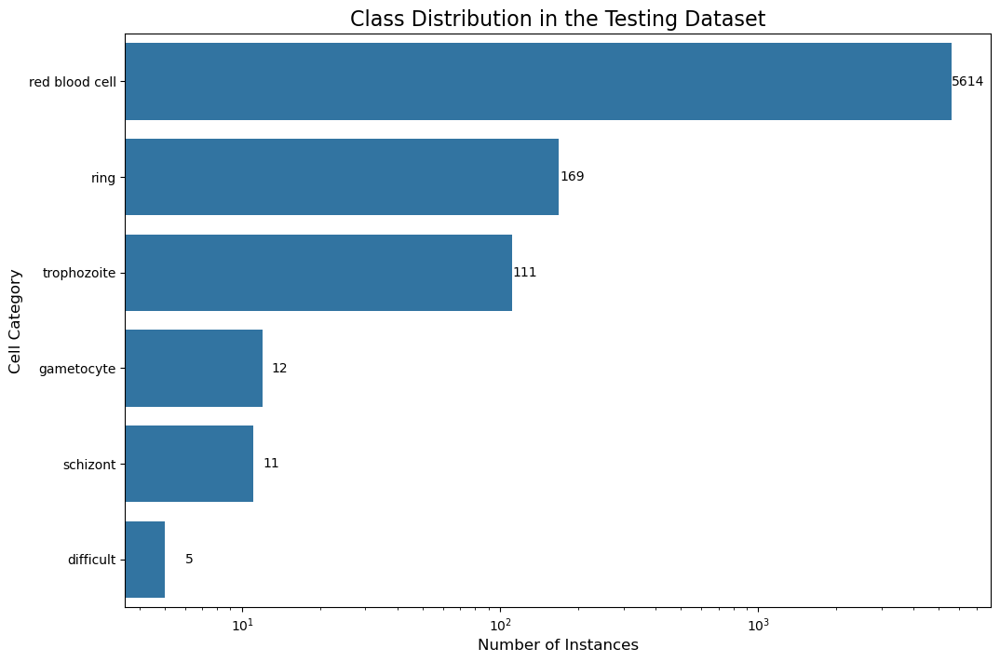

In [20]:
ploting_cells_count(train_json_path, "Training")
ploting_cells_count(test_json_path, "Testing")

### Visualizing Images

In [22]:
# Class for loading and displaying images with bouding boxes
class MalariaDataset(torch.utils.data.Dataset):
    def __init__(self, json_path, image_root, transform=None, category_map=None):
        with open(json_path, 'r') as f:
            data = json.load(f)

        # Here each dict 'data' represents an image entry
        self.entries = data
        self.image_root = image_root
        self.transform = transform

        if category_map is None:
            all_categories = set()
            for entry in self.entries:
                if 'objects' in entry:
                    for obj in entry['objects']:
                        if 'category' in obj:
                            all_categories.add(obj['category'])
            self.category_map = {cat: idx for idx, cat in enumerate(sorted(list(all_categories)))}
        else:
            self.category_map = category_map

        # Creating a reverse map for visualization (idx to category name)
        self.idx_to_category = {idx: cat for cat, idx in self.category_map.items()}


    def __len__(self):
        return len(self.entries)

    def __getitem__(self, idx):
        entry = self.entries[idx]
        # '/', strip path for os.path.join
        image_relative_path = entry['image']['pathname'].lstrip('/')
        image_path = os.path.join(self.image_root, image_relative_path)
        image = Image.open(image_path).convert("RGB")

        boxes = []
        labels = []
        if 'objects' in entry:
            for obj in entry['objects']:
                bb = obj['bounding_box']
                # Extracting cells, 'c' for column (x) and 'r' for row (y)
                x_min = bb['minimum']['c']
                y_min = bb['minimum']['r']
                x_max = bb['maximum']['c']
                y_max = bb['maximum']['r']
                boxes.append([x_min, y_min, x_max, y_max])
                labels.append(self.category_map[obj['category']])

        # Converting to tensors
        boxes = torch.tensor(boxes, dtype=torch.float32)
        labels = torch.tensor(labels, dtype=torch.int64)

        # Creating a target dictionary for bounding box and label information
        target = {
            'boxes': boxes,
            'labels': labels,
            'image_id': torch.tensor([idx]),
            'original_image_path': image_path
        }

        # For visualization, we want the original PIL image before performing ToTensor/Normalize.
        # Let's return the PIL image here and apply transform if specified.
        if self.transform:
            # If transform includes ToTensor, this will be a tensor.
            # For plotting, we'll convert it back to PIL/NumPy.
            transformed_image = self.transform(image)
            return transformed_image, target, image # Return original PIL image for plotting
        else:
            return image, target, image # Return original PIL image for plotting

In [23]:
print(f"Loading data")
try:
    train_ds = MalariaDataset(train_json_path, root_path, transform=None)
    print(f"Training dataset loaded with {len(train_ds)} entries.")
except Exception as e:
    print(f"Error loading training dataset: {e}")
    train_ds = None

try:
    test_ds = MalariaDataset(test_json_path, root_path, transform=None)
    print(f"Training dataset loaded with {len(test_ds)} entries.")
except Exception as e:
    print(f"Error loading training dataset: {e}")
    test_ds = None

Loading data
Training dataset loaded with 1208 entries.
Training dataset loaded with 120 entries.


#### Images with their bounding boxes


Visualizing images with bounding boxes from Training Dataset:
  Plotted bounding box for 'red blood cell' at (1440.0, 1057.0) for 8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png
  Plotted bounding box for 'red blood cell' at (1303.0, 868.0) for 8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png
  Plotted bounding box for 'red blood cell' at (900.0, 578.0) for 8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png
  Plotted bounding box for 'red blood cell' at (611.0, 304.0) for 8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png
  Plotted bounding box for 'red blood cell' at (881.0, 198.0) for 8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png
  Plotted bounding box for 'red blood cell' at (1480.0, 193.0) for 8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png
  Plotted bounding box for 'red blood cell' at (1384.0, 257.0) for 8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png
  Plotted bounding box for 'red blood cell' at (302.0, 430.0) for 8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png
  Plotted bounding box for 'red blood cell' at (1191.0, 747.0) for 8d02117d-

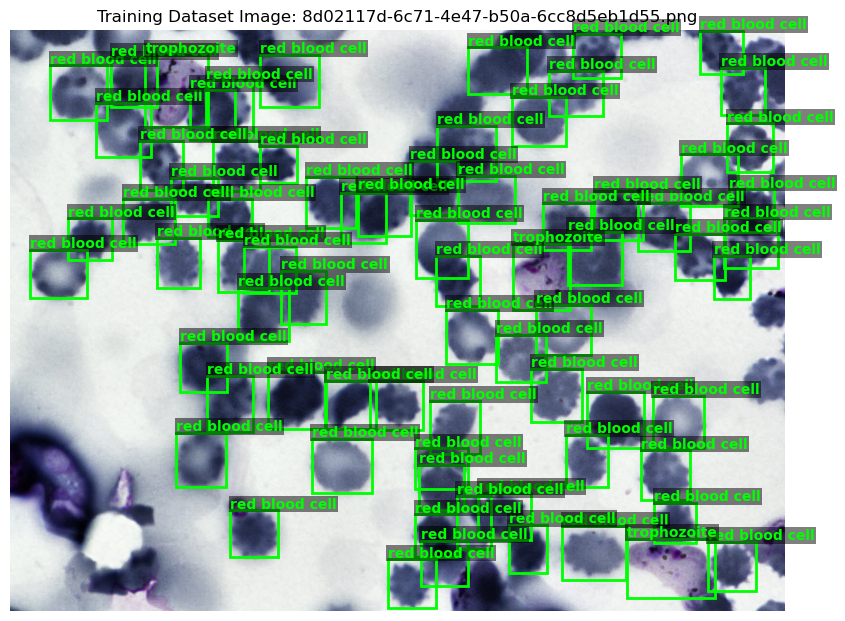


Finished visualizing images with bounding boxes.

Visualizing images with bounding boxes from Testing Dataset:
  Plotted bounding box for 'red blood cell' at (1744.0, 576.0) for 41be1bd3-0d31-4881-bf1f-3ccdfa21ff12.jpg
  Plotted bounding box for 'red blood cell' at (1249.0, 863.0) for 41be1bd3-0d31-4881-bf1f-3ccdfa21ff12.jpg
  Plotted bounding box for 'red blood cell' at (1573.0, 210.0) for 41be1bd3-0d31-4881-bf1f-3ccdfa21ff12.jpg
  Plotted bounding box for 'red blood cell' at (1124.0, 1017.0) for 41be1bd3-0d31-4881-bf1f-3ccdfa21ff12.jpg
  Plotted bounding box for 'red blood cell' at (1655.0, 572.0) for 41be1bd3-0d31-4881-bf1f-3ccdfa21ff12.jpg
  Plotted bounding box for 'red blood cell' at (1307.0, 477.0) for 41be1bd3-0d31-4881-bf1f-3ccdfa21ff12.jpg
  Plotted bounding box for 'red blood cell' at (595.0, 962.0) for 41be1bd3-0d31-4881-bf1f-3ccdfa21ff12.jpg
  Plotted bounding box for 'red blood cell' at (1699.0, 417.0) for 41be1bd3-0d31-4881-bf1f-3ccdfa21ff12.jpg
  Plotted bounding box f

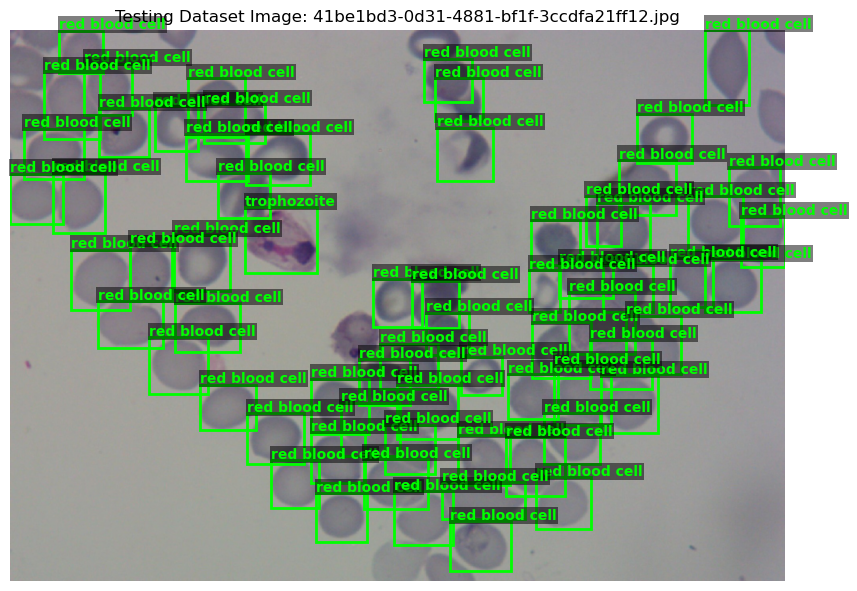


Finished visualizing images with bounding boxes.


In [24]:
def visualize_images_with_bboxes(dataset, dataset_name="Dataset", num_images_to_show=1):
    """
    Visualize images with bounding boxes from a dataset.

    Args:
        dataset (torch.utils.data.Dataset): PyTorch dataset where __getitem__ returns
            (transformed_image, target, original_pil_image).
        dataset_name (str): Name of the dataset (e.g., "Training Dataset").
        num_images_to_show (int): Number of images to visualize (default: 1).

    Returns:
        None: Displays plots with bounding boxes and prints details.
    """
    print(f"\nVisualizing images with bounding boxes from {dataset_name}:")

    if dataset is None:
        print("No dataset available for visualization.")
        return

    num_images_to_show = min(num_images_to_show, len(dataset))

    for i in range(num_images_to_show):
        try:
            # __getitem__ returns (transformed_image, target, original_pil_image)
            _, target, original_pil_image = dataset[i]

            image_filename = os.path.basename(target['original_image_path'])
            boxes = target['boxes'].tolist()  # Convert tensor to list
            labels = target['labels'].tolist()

            # Convert PIL Image to NumPy array for matplotlib
            img_np = original_pil_image

            # Create plot
            fig, ax = plt.subplots(1, figsize=(10, 8))
            ax.imshow(img_np)
            ax.set_title(f'{dataset_name} Image: {image_filename}')
            ax.axis('off')

            if not boxes:
                print(f"No bounding boxes found for {image_filename}.")
            else:
                for bbox_coords, label_idx in zip(boxes, labels):
                    # Bounding box format: [x_min, y_min, x_max, y_max]
                    x_min, y_min, x_max, y_max = bbox_coords
                    width = x_max - x_min
                    height = y_max - y_min

                    # Get label name
                    label_name = dataset.idx_to_category.get(label_idx, f"Unknown ({label_idx})")
                    rect = patches.Rectangle((x_min, y_min), width, height, linewidth=2,
                                            edgecolor='lime', facecolor='none')
                    ax.add_patch(rect)
                    ax.text(x_min, y_min - 5, label_name, color='lime', fontsize=10,
                            weight='bold', bbox=dict(facecolor='black', alpha=0.5, edgecolor='none', pad=1))
                    print(f"  Plotted bounding box for '{label_name}' at ({x_min}, {y_min}) for {image_filename}")

            plt.show()

        except Exception as e:
            print(f"Error visualizing image {i} from {dataset_name}: {e}")

    print("\nFinished visualizing images with bounding boxes.")

visualize_images_with_bboxes(train_ds, dataset_name="Training Dataset", num_images_to_show=1)
visualize_images_with_bboxes(test_ds, dataset_name="Testing Dataset", num_images_to_show=1)

## Extract & Save Cells

In [31]:
def visualize_cells_in_grid(dataset, num_images=1, dataset_name="Dataset", output_folder=None):
    """
    Visualize cell images from bounding boxes in a grid layout.

    Args:
        dataset (torch.utils.data.Dataset): PyTorch dataset returning (img, target, pil_img).
        num_images (int): Number of images to process (default: 1).
        dataset_name (str): Name of dataset for titles (default: "Dataset").
        output_folder (str, optional): Folder to save grid images (default: None, display only).

    Returns:
        None: Displays or saves grid of cell images.
    """
    if dataset is None:
        print("No dataset provided.")
        return

    print(f"\nProcessing {num_images} image(s) from {dataset_name}...")

    for i in range(min(num_images, len(dataset))):
        try:
            # Get image data
            _, target, pil_img = dataset[i]
            img_name = os.path.basename(target['original_image_path'])
            boxes = target['boxes'].tolist()
            labels = target['labels'].tolist()

            if not boxes:
                print(f"No bounding boxes in {img_name}. Skipping.")
                continue

            # Calculate grid size (aim for ~10 images per row)
            n_cells = len(boxes)
            cols = min(10, n_cells)
            rows = math.ceil(n_cells / cols)
            fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))
            axes = axes.flatten() if n_cells > 1 else [axes]

            print(f"Found {n_cells} cells in {img_name}.")

            # Process each cell
            for idx, (box, label) in enumerate(zip(boxes, labels)):
                x_min, y_min, x_max, y_max = map(int, box)
                cell_img = pil_img.crop((x_min, y_min, x_max, y_max))
                label_name = dataset.idx_to_category.get(label, f"Unknown_{label}")

                # Plot cell
                axes[idx].imshow(cell_img)
                axes[idx].set_title(f"Cell {idx+1}: {label_name}", fontsize=8)
                axes[idx].axis('off')

            # Hide empty subplots
            for idx in range(len(boxes), len(axes)):
                axes[idx].axis('off')

            # Set figure title
            fig.suptitle(f"{dataset_name}: {img_name}", fontsize=12)
            plt.tight_layout()

            # Save or display
            if output_folder:
                os.makedirs(output_folder, exist_ok=True)
                output_path = os.path.join(output_folder, f"{img_name}_grid.png")
                plt.savefig(output_path)
                print(f"Saved grid to {output_path}")
            else:
                plt.show()

        except Exception as e:
            print(f"Error processing image {i+1} ({img_name}): {e}")

    print("\nFinished processing images.")


Processing 1 image(s) from Training dataset...
Found 74 cells in 8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png.


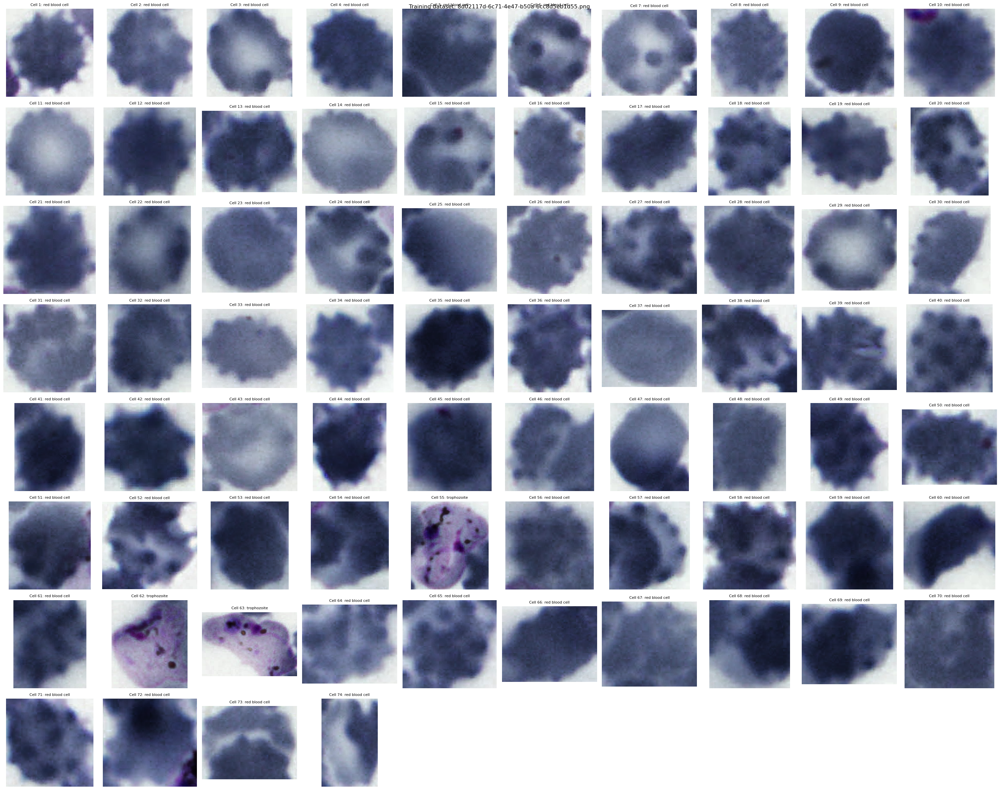


Finished processing images.


In [32]:
visualize_cells_in_grid(train_ds, num_images=1, dataset_name="Training dataset", output_folder=None)

### Save extracted cells

In [34]:
train_folder = os.path.join(root_path,'training_ds')
test_folder = os.path.join(root_path,'testing_ds')

In [35]:
def extract_and_save_cells(dataset, output_base, dataset_name="Dataset", num_images=None):
    """
    Extract and save cell images from bounding boxes in a dataset.

    Args:
        dataset (torch.utils.data.Dataset): PyTorch dataset returning (img, target, pil_img).
        output_base (str): Base folder to save cropped images (e.g., 'extracted_images_by_classes').
        dataset_name (str): Name of dataset for logging (default: "Dataset").
        num_images (int, optional): Number of images to process. If None, processes all images.

    Returns:
        dict: Summary of processed images, skipped images, saved cells, invalid boxes, and unique images.
    """
    if dataset is None:
        print("Error: Dataset is None.")
        return {"processed_images": 0, "skipped_images": 0, "saved_cells": 0, "invalid_boxes": 0, "unique_images": 0}

    os.makedirs(output_base, exist_ok=True)
    print(f"Saving cropped cells to: {output_base}")

    # Initialize counters
    processed_images = 0
    skipped_images = 0
    saved_cells = 0
    invalid_boxes = 0
    unique_images = set()

    # Use len(dataset) if num_images is not specified
    total_images = min(num_images, len(dataset)) if num_images is not None else len(dataset)
    print(f"\nStarting extraction from {total_images} images in {dataset_name}...\n")

    for i in range(total_images):
        print(f"--- Processing image {i+1}/{total_images} ---")
        try:
            _, target, pil_img = dataset[i]
            img_name = os.path.basename(target['original_image_path'])
            boxes = target['boxes'].tolist()
            labels = target['labels'].tolist()

            if not boxes:
                print(f"Skipped: No bounding boxes in {img_name}")
                skipped_images += 1
                continue

            valid_box_found = False
            for idx, (box, label) in enumerate(zip(boxes, labels)):
                x_min, y_min, x_max, y_max = map(int, box)

                # Validate bounding box
                if x_max <= x_min or y_max <= y_min:
                    print(f"Skipped invalid box in {img_name}: {box}")
                    invalid_boxes += 1
                    continue

                # Ensure box is within image bounds
                x_min, y_min = max(0, x_min), max(0, y_min)
                x_max, y_max = min(pil_img.width, x_max), min(pil_img.height, y_max)

                # Crop and save cell
                cell_img = pil_img.crop((x_min, y_min, x_max, y_max))
                label_name = dataset.idx_to_category.get(label, f"Unknown_{label}")
                sanitized_label = label_name.replace(" ", "_").replace("(", "").replace(")", "")
                class_folder = os.path.join(output_base, sanitized_label)
                os.makedirs(class_folder, exist_ok=True)

                base_name, _ = os.path.splitext(img_name)
                new_filename = f"{base_name}_cell_{idx+1}_{sanitized_label}.png"
                save_path = os.path.join(class_folder, new_filename)
                cell_img.save(save_path)
                saved_cells += 1
                valid_box_found = True
                print(f"   Saved: {new_filename}")

            if valid_box_found:
                processed_images += 1
                unique_images.add(img_name)
            else:
                skipped_images += 1

        except Exception as e:
            print(f"Error processing image {i+1} ({img_name}): {e}")
            skipped_images += 1

    # Summary report
    summary = {
        "processed_images": processed_images,
        "skipped_images": skipped_images,
        "saved_cells": saved_cells,
        "invalid_boxes": invalid_boxes,
        "unique_images": len(unique_images)
    }
    print("\n=== Extraction Complete ===")
    print(f"Total images in dataset: {total_images}")
    print(f"Processed images (at least one valid box): {processed_images}")
    print(f"Skipped images (no or invalid boxes): {skipped_images}")
    print(f"Invalid bounding boxes skipped: {invalid_boxes}")
    print(f"Total cropped and saved cell images: {saved_cells}")
    print(f"Unique image files used: {len(unique_images)}")

    return summary

In [36]:
train_class_ext = os.path.join(train_folder, 'extracted_by_class')
extract_and_save_cells(train_ds, output_base=train_class_ext, dataset_name="Training dataset")

Saving cropped cells to: dataset\malaria\training_ds\extracted_by_class

Starting extraction from 1208 images in Training dataset...

--- Processing image 1/1208 ---
   Saved: 8d02117d-6c71-4e47-b50a-6cc8d5eb1d55_cell_1_red_blood_cell.png
   Saved: 8d02117d-6c71-4e47-b50a-6cc8d5eb1d55_cell_2_red_blood_cell.png
   Saved: 8d02117d-6c71-4e47-b50a-6cc8d5eb1d55_cell_3_red_blood_cell.png
   Saved: 8d02117d-6c71-4e47-b50a-6cc8d5eb1d55_cell_4_red_blood_cell.png
   Saved: 8d02117d-6c71-4e47-b50a-6cc8d5eb1d55_cell_5_red_blood_cell.png
   Saved: 8d02117d-6c71-4e47-b50a-6cc8d5eb1d55_cell_6_red_blood_cell.png
   Saved: 8d02117d-6c71-4e47-b50a-6cc8d5eb1d55_cell_7_red_blood_cell.png
   Saved: 8d02117d-6c71-4e47-b50a-6cc8d5eb1d55_cell_8_red_blood_cell.png
   Saved: 8d02117d-6c71-4e47-b50a-6cc8d5eb1d55_cell_9_red_blood_cell.png
   Saved: 8d02117d-6c71-4e47-b50a-6cc8d5eb1d55_cell_10_red_blood_cell.png
   Saved: 8d02117d-6c71-4e47-b50a-6cc8d5eb1d55_cell_11_red_blood_cell.png
   Saved: 8d02117d-6c71-4e47-

{'processed_images': 1208,
 'skipped_images': 0,
 'saved_cells': 80113,
 'invalid_boxes': 0,
 'unique_images': 1208}

In [38]:
test_class_ext = os.path.join(test_folder, 'extracted_by_class')
extract_and_save_cells(test_ds, output_base=test_class_ext, dataset_name="Testing dataset")

Saving cropped cells to: dataset\malaria\testing_ds\extracted_by_class

Starting extraction from 120 images in Testing dataset...

--- Processing image 1/120 ---
   Saved: 41be1bd3-0d31-4881-bf1f-3ccdfa21ff12_cell_1_red_blood_cell.png
   Saved: 41be1bd3-0d31-4881-bf1f-3ccdfa21ff12_cell_2_red_blood_cell.png
   Saved: 41be1bd3-0d31-4881-bf1f-3ccdfa21ff12_cell_3_red_blood_cell.png
   Saved: 41be1bd3-0d31-4881-bf1f-3ccdfa21ff12_cell_4_red_blood_cell.png
   Saved: 41be1bd3-0d31-4881-bf1f-3ccdfa21ff12_cell_5_red_blood_cell.png
   Saved: 41be1bd3-0d31-4881-bf1f-3ccdfa21ff12_cell_6_red_blood_cell.png
   Saved: 41be1bd3-0d31-4881-bf1f-3ccdfa21ff12_cell_7_red_blood_cell.png
   Saved: 41be1bd3-0d31-4881-bf1f-3ccdfa21ff12_cell_8_red_blood_cell.png
   Saved: 41be1bd3-0d31-4881-bf1f-3ccdfa21ff12_cell_9_red_blood_cell.png
   Saved: 41be1bd3-0d31-4881-bf1f-3ccdfa21ff12_cell_10_red_blood_cell.png
   Saved: 41be1bd3-0d31-4881-bf1f-3ccdfa21ff12_cell_11_red_blood_cell.png
   Saved: 41be1bd3-0d31-4881-bf1f

{'processed_images': 120,
 'skipped_images': 0,
 'saved_cells': 5922,
 'invalid_boxes': 0,
 'unique_images': 120}

## Count images in the extracted folder

In [39]:
import os
import csv

def count_images_per_class(base_folder, extensions=('.png', '.jpg', '.jpeg'), recursive=True, csv_output=None):
    """
    Count images in each class folder within the base directory.

    Args:
        base_folder (str): Path to the base directory containing class folders.
        extensions (tuple): File extensions to count (default: ('.png', '.jpg', '.jpeg')).
        recursive (bool): If True, scan subdirectories recursively (default: True).
        csv_output (str, optional): Path to save counts as CSV (default: None).

    Returns:
        dict: Dictionary of {class_name: image_count} or None if directory invalid.
    """
    if not os.path.isdir(base_folder):
        print(f"Error: Directory '{base_folder}' not found or is not a directory.")
        return None

    class_counts = {}
    print(f"\nScanning images in '{base_folder}'...")

    # Walk directory (recursive or top-level only)
    for root, dirs, files in os.walk(base_folder) if recursive else [(base_folder, os.listdir(base_folder), os.listdir(base_folder))]:
        class_name = os.path.basename(root)
        if class_name == os.path.basename(base_folder):
            continue

        # Count images with specified extensions
        image_count = sum(1 for f in files if f.lower().endswith(extensions))
        if image_count > 0:
            class_counts[class_name] = image_count

    if not class_counts:
        print(f"No images found in '{base_folder}' with extensions {extensions}.")
        return class_counts

    # Calculate totals
    total_images = sum(class_counts.values())
    total_classes = len(class_counts)

    # Print formatted table
    print("\nImage Counts per Class:")
    print(f"{'Class Name':<30} {'Images':>10}")
    print("-" * 42)
    for class_name, count in sorted(class_counts.items()):
        print(f"{class_name:<30} {count:>10}")
    print("-" * 42)
    print(f"{'Total':<30} {total_images:>10}")
    print(f"Total classes: {total_classes}")

    # Save to CSV if specified
    if csv_output:
        os.makedirs(os.path.dirname(csv_output) or '.', exist_ok=True)
        with open(csv_output, 'w', newline='') as f:
            writer = csv.writer(f)
            writer.writerow(['Class Name', 'Image Count'])
            for class_name, count in sorted(class_counts.items()):
                writer.writerow([class_name, count])
            writer.writerow(['Total', total_images])
        print(f"Saved counts to '{csv_output}'")

    return class_counts

In [46]:
count_images_per_class(train_class_ext)


Scanning images in 'dataset\malaria\training_ds\extracted_by_class'...

Image Counts per Class:
Class Name                         Images
------------------------------------------
difficult                             441
gametocyte                            144
leukocyte                             103
red_blood_cell                      77420
ring                                  353
schizont                              179
trophozoite                          1473
------------------------------------------
Total                               80113
Total classes: 7


{'difficult': 441,
 'gametocyte': 144,
 'leukocyte': 103,
 'red_blood_cell': 77420,
 'ring': 353,
 'schizont': 179,
 'trophozoite': 1473}

In [42]:
count_images_per_class(test_class_ext)


Scanning images in 'dataset\malaria\testing_ds\extracted_by_class'...

Image Counts per Class:
Class Name                         Images
------------------------------------------
difficult                              11
gametocyte                             14
leukocyte                               2
red_blood_cell                       6301
ring                                  172
schizont                               13
trophozoite                           128
------------------------------------------
Total                                6641
Total classes: 7


{'difficult': 11,
 'gametocyte': 14,
 'leukocyte': 2,
 'red_blood_cell': 6301,
 'ring': 172,
 'schizont': 13,
 'trophozoite': 128}

## Show the Extracted data

In [52]:
def get_image_paths_and_labels(base_folder):
    """
    Here we collect image paths and their corresponding class labels derived from the folder names.
    Args:
        base_folder (str): The path to the directory containing class subfolders.
    Returns:
        list: A list of tuples, where each tuple is (image_path, class_name).
        Returns None if the directory is not found.
    """
    if not os.path.isdir(base_folder):
        print(f"Error: Directory not found at '{base_folder}'")
        return None

    image_data = []
    print(f"Scanning for images in '{base_folder}'...")

    # os.walk for traversing the directory tree
    for root, _, files in os.walk(base_folder):
        # The class name is the name of the folder the image is in
        class_name = os.path.basename(root)

        # Process class subfolders, ignoring the first directory
        if class_name == os.path.basename(base_folder):
            continue

        for filename in files:
            if filename.lower().endswith(('.png', '.jpg', 'jpeg')):
                # Constructing the full path to the image
                image_path = os.path.join(root, filename)
                # Appending the path and its class name to our list
                image_data.append((image_path, class_name))

    return image_data

Scanning for images in 'dataset\malaria\training_ds\extracted_by_class'...

Scan complete. Found 80113 images.
Found 7 unique classes: ['difficult', 'gametocyte', 'leukocyte', 'red_blood_cell', 'ring', 'schizont', 'trophozoite']

Displaying a random sample of images...
  Displaying image for label: 'red_blood_cell' from path: dataset\malaria\training_ds\extracted_by_class\red_blood_cell\de6d3020-9347-473b-9146-8909627790f6_cell_30_red_blood_cell.png


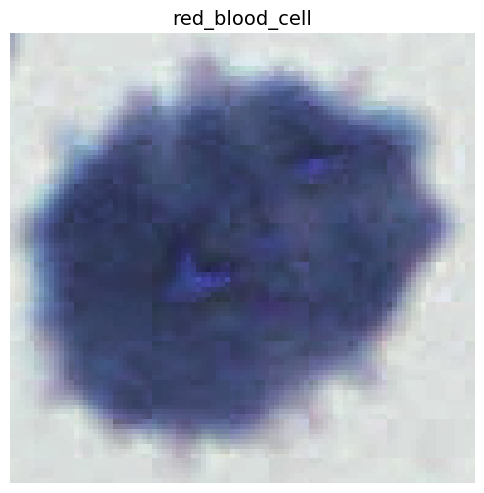

  Displaying image for label: 'red_blood_cell' from path: dataset\malaria\training_ds\extracted_by_class\red_blood_cell\5e974892-0ebe-4037-8427-ea8616d6d3b8_cell_114_red_blood_cell.png


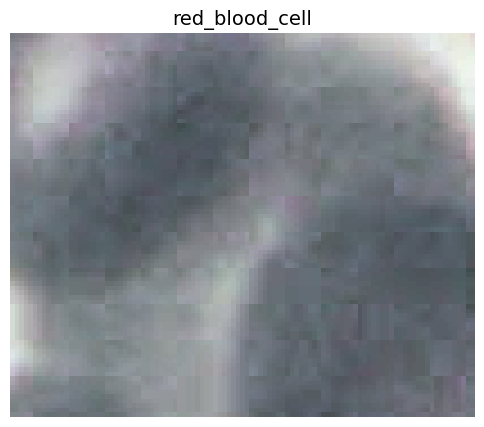

  Displaying image for label: 'red_blood_cell' from path: dataset\malaria\training_ds\extracted_by_class\red_blood_cell\2518f6e4-29cc-4ae4-a914-b215a4c56099_cell_121_red_blood_cell.png


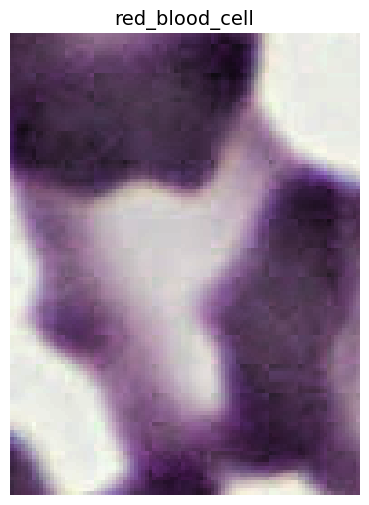

  Displaying image for label: 'red_blood_cell' from path: dataset\malaria\training_ds\extracted_by_class\red_blood_cell\3090a362-1f3d-49e9-a76e-ce76ff9c2276_cell_12_red_blood_cell.png


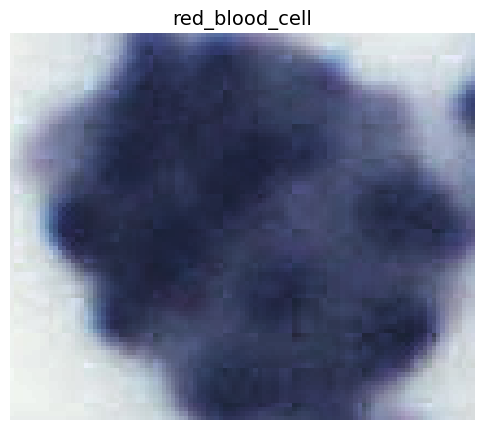

  Displaying image for label: 'red_blood_cell' from path: dataset\malaria\training_ds\extracted_by_class\red_blood_cell\07a80340-f65e-4f58-9317-94bb6ebd5a28_cell_95_red_blood_cell.png


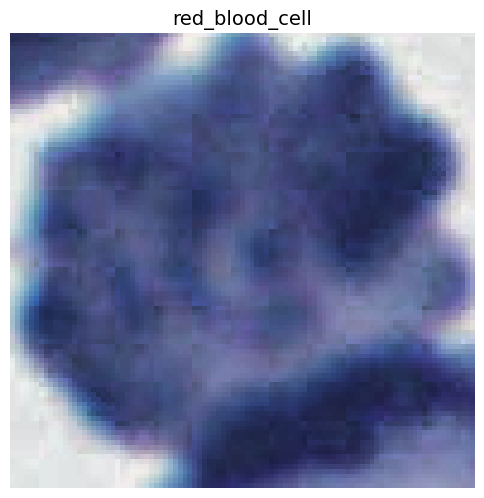

In [53]:
try:
    path_to_scan = train_class_ext
except NameError:
    # If 'root_path' is not provided
    print("Variable  not found")
    path_to_scan = root_path

all_images = get_image_paths_and_labels(path_to_scan)

# 3. Print a summary and display a sample
if all_images:
    print(f"\nScan complete. Found {len(all_images)} images.")

    unique_classes = sorted(list(set(item[1] for item in all_images)))
    print(f"Found {len(unique_classes)} unique classes: {unique_classes}")

    # Visualizing images
    print("\nDisplaying a random sample of images...")
    sample_size = min(5, len(all_images))
    random_sample = random.sample(all_images, sample_size)

    for path, label in random_sample:
        print(f"  Displaying image for label: '{label}' from path: {path}")

        try:
            img = Image.open(path)
            fig, ax = plt.subplots(figsize=(6, 6))
            ax.imshow(img)
            ax.set_title(label, fontsize=14)
            # Hiding the x and y axes
            ax.axis('off')
            plt.show()

        except Exception as e:
            print(f"Could not display image {path}. Reason: {e}")

Scanning for images in 'dataset\malaria\testing_ds\extracted_by_class'...

Scan complete. Found 6641 images.
Found 7 unique classes: ['difficult', 'gametocyte', 'leukocyte', 'red_blood_cell', 'ring', 'schizont', 'trophozoite']

Displaying a random sample of images...
  Displaying image for label: 'red_blood_cell' from path: dataset\malaria\testing_ds\extracted_by_class\red_blood_cell\446734b7-6bc9-4a66-a3a0-49f6aa90db33_cell_52_red_blood_cell.png


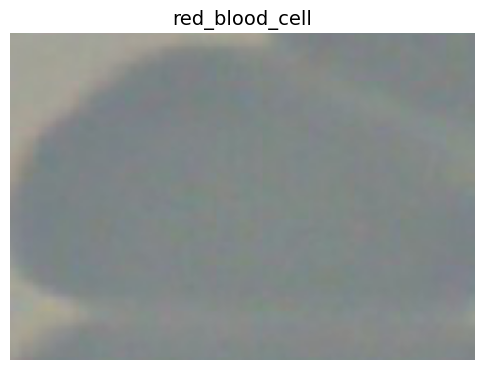

  Displaying image for label: 'red_blood_cell' from path: dataset\malaria\testing_ds\extracted_by_class\red_blood_cell\c328260d-bafa-4aaa-9e7a-79bc165d7fdb_cell_17_red_blood_cell.png


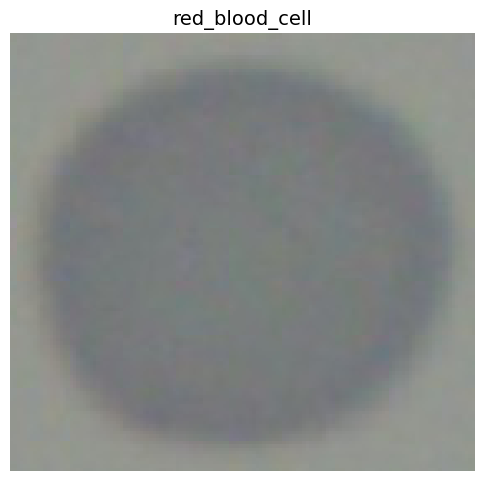

  Displaying image for label: 'red_blood_cell' from path: dataset\malaria\testing_ds\extracted_by_class\red_blood_cell\bc820fb6-5ba8-4438-affe-e250d2ad5eb0_cell_38_red_blood_cell.png


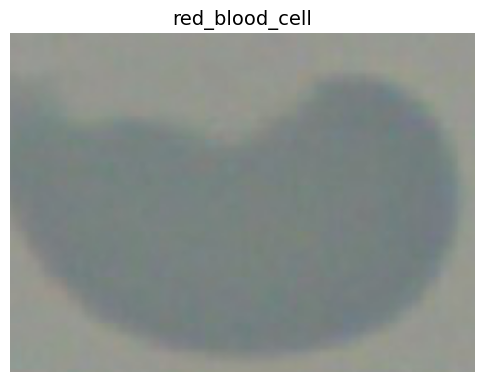

  Displaying image for label: 'red_blood_cell' from path: dataset\malaria\testing_ds\extracted_by_class\red_blood_cell\4dcd5df9-c56c-471b-8d44-fa4b1ca9a600_cell_11_red_blood_cell.png


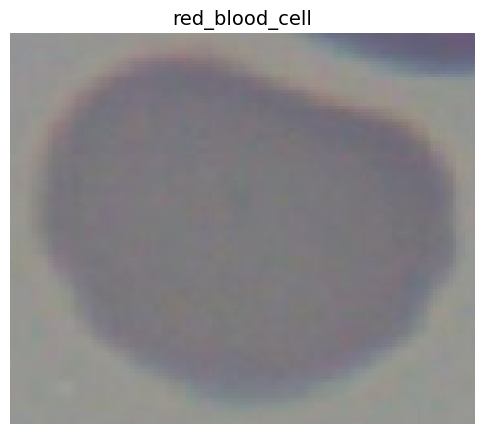

  Displaying image for label: 'red_blood_cell' from path: dataset\malaria\testing_ds\extracted_by_class\red_blood_cell\f0ee03d6-c57b-43a0-8812-359330bdb93a_cell_78_red_blood_cell.png


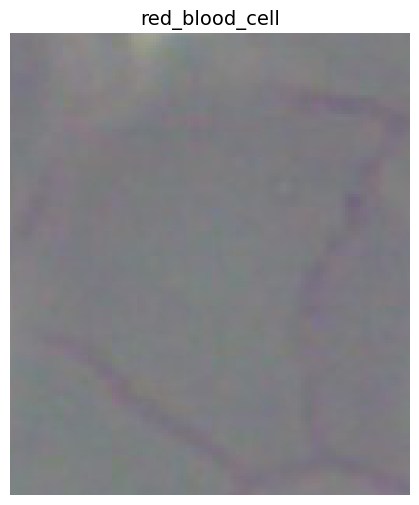

In [54]:
try:
    path_to_scan = test_class_ext
except NameError:
    # If 'root_path' is not provided
    print("Variable  not found")
    path_to_scan = root_path

all_images = get_image_paths_and_labels(path_to_scan)

# 3. Print a summary and display a sample
if all_images:
    print(f"\nScan complete. Found {len(all_images)} images.")

    unique_classes = sorted(list(set(item[1] for item in all_images)))
    print(f"Found {len(unique_classes)} unique classes: {unique_classes}")

    # Visualizing images
    print("\nDisplaying a random sample of images...")
    sample_size = min(5, len(all_images))
    random_sample = random.sample(all_images, sample_size)

    for path, label in random_sample:
        print(f"  Displaying image for label: '{label}' from path: {path}")

        try:
            img = Image.open(path)
            fig, ax = plt.subplots(figsize=(6, 6))
            ax.imshow(img)
            ax.set_title(label, fontsize=14)
            # Hiding the x and y axes
            ax.axis('off')
            plt.show()

        except Exception as e:
            print(f"Could not display image {path}. Reason: {e}")

## Resizing Dataset

#### Check image sizes

In [55]:
# Analyse image size
def analyse_image_sizes(base_folder):
    """
        Walks through subdirectories of a base folder, analyzes image dimensions,
        and prints a summary of all unique sizes found.
    """
    if not os.path.isdir(base_folder):
        print(f"Error: Directory not found at '{base_folder}'")
        return

    # Using defaultdict to  count occurrences of each image size
    image_sizes = defaultdict(int)
    total_images = 0

    print(f"Starting analysis of images in '{base_folder}'...")

    # os.walk, for recursively visiting all files
    for root, _, files in os.walk(base_folder):
        for filename in files:
            # Check for image file extensions
            if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
                image_path = os.path.join(root, filename)
                try:
                    with Image.open(image_path) as img:
                        size = img.size
                        image_sizes[size] += 1
                        total_images += 1
                except Exception as e:
                    print(f"Warning: Could not read or process file: {image_path}. Reason: {e}")

    # Summary
    print("\n--- Image Size Analysis Complete ---")
    if not image_sizes:
        print("No images were found in the specified directory.")
        return

    print(f"Analyzed {total_images} images.")
    print(f"Found {len(image_sizes)} unique dimensions.")

    if len(image_sizes) > 1:
        print("\nImage sizes (Width x Height):")
        # Sort the dictionary by the number of images (count) in descending order
        sorted_sizes = sorted(image_sizes.items(), key=lambda item: item[1], reverse=True)
        for (width, height), count in sorted_sizes:
            print(f"  - {width:>4}x{height:<4}  : {count} images")
        print("\nMultiple image sizes were found.")
    else:
        (width, height), count = list(image_sizes.items())[0]
        print(f"\nAll {count} images have same size of {width}x{height}.")

In [ ]:
analyse_image_sizes(train_class_ext)
# took 16 min

Starting analysis of images in 'dataset\malaria\training_ds\extracted_by_class'...

--- Image Size Analysis Complete ---
Analyzed 80113 images.
Found 7130 unique dimensions.

Image sizes (Width x Height):
  -  113x111   : 104 images
  -  109x107   : 103 images
  -  109x111   : 103 images
  -  105x105   : 102 images
  -  103x101   : 99 images
  -  100x102   : 98 images
  -  109x105   : 97 images
  -  112x111   : 96 images
  -  104x104   : 95 images
  -  105x101   : 95 images
  -  107x105   : 94 images
  -  103x105   : 94 images
  -  103x98    : 92 images
  -  103x99    : 91 images
  -  103x102   : 91 images
  -  105x103   : 90 images
  -  103x103   : 90 images
  -  103x107   : 89 images
  -  107x109   : 88 images
  -  104x107   : 88 images
  -  106x107   : 87 images
  -  109x112   : 87 images
  -  112x112   : 87 images
  -   96x98    : 86 images
  -   98x98    : 86 images
  -  104x105   : 85 images
  -  102x102   : 85 images
  -   99x99    : 85 images
  -  109x109   : 84 images
  -  110

In [57]:
analyse_image_sizes(test_class_ext)

Starting analysis of images in 'dataset\malaria\testing_ds\extracted_by_class'...

--- Image Size Analysis Complete ---
Analyzed 6640 images.
Found 3458 unique dimensions.

Image sizes (Width x Height):
  -  150x136   : 11 images
  -  146x131   : 11 images
  -  147x136   : 11 images
  -  150x140   : 10 images
  -  148x139   : 10 images
  -  127x120   : 9 images
  -  133x122   : 9 images
  -  138x132   : 9 images
  -  143x138   : 9 images
  -  146x144   : 9 images
  -  137x133   : 9 images
  -  138x138   : 8 images
  -  144x138   : 8 images
  -  142x129   : 8 images
  -  134x124   : 8 images
  -  137x129   : 8 images
  -  143x133   : 8 images
  -  138x127   : 8 images
  -  139x135   : 8 images
  -  130x123   : 8 images
  -  156x142   : 8 images
  -  139x129   : 8 images
  -  133x123   : 8 images
  -  136x141   : 8 images
  -  146x136   : 8 images
  -  143x125   : 8 images
  -  135x137   : 8 images
  -  137x125   : 8 images
  -  137x134   : 8 images
  -  136x129   : 8 images
  -  139x132

#### Resizing and saving

In [58]:
def resize_image(source_path, dest_path, target_size):
    """Open, resize, and save image."""
    try:
        with Image.open(source_path) as img:
            resized_img = img.resize(target_size, Image.Resampling.LANCZOS)
            resized_img.save(dest_path)
        return None
    except Exception as e:
        return f"Failed to process {source_path}: {e}"

def create_resized_dataset(source_folder, destination_folder, target_size):
    """
        Resizes all images in source_folder and saves them to destination_folder.
        Preserves folder structure. Uses multithreading to avoid Windows multiprocessing issues.
    """
    if not os.path.isdir(source_folder):
        print(f"Error: Source directory not found at '{source_folder}'")
        return

    print(f"Source: '{source_folder}'")
    print(f"Destination: '{destination_folder}'")
    print(f"Target Size: {target_size}")

    tasks = []
    for root, _, files in os.walk(source_folder):
        dest_dir = root.replace(source_folder, destination_folder, 1)
        os.makedirs(dest_dir, exist_ok=True)

        for filename in files:
            if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
                source_path = os.path.join(root, filename)
                dest_path = os.path.join(dest_dir, filename)
                tasks.append((source_path, dest_path, target_size))

    if not tasks:
        print("No images found to process.")
        return

    print(f"\nFound {len(tasks)} images to resize. Starting processing...")
    start_time = time.time()
    errors = []

    # Use ThreadPoolExecutor for better I/O-bound performance and compatibility
    with ThreadPoolExecutor(max_workers=8) as executor:
        futures = [executor.submit(resize_image, *task) for task in tasks]
        for i, future in enumerate(as_completed(futures)):
            result = future.result()
            if result:
                errors.append(result)

            if (i + 1) % 500 == 0:
                print(f"Processed {i + 1}/{len(tasks)} images")

    duration = time.time() - start_time
    print("\n --- Resizing Complete! ---")
    print(f"Successfully processed: {len(tasks) - len(errors)} images")
    print(f"Failed: {len(errors)} images")
    print(f"Total time: {duration:.2f} seconds")

    if errors:
        print("\nSample errors:")
        for msg in errors[:5]:
            print(f"  - {msg}")

    print(f"Resized dataset saved at: '{destination_folder}'")

In [ ]:
# saving resized images of train dataset
SOURCE_DIR = train_class_ext

DESTINATION_DIR = os.path.join(train_folder, 'resized_128')
TARGET_IMAGE_SIZE = (128, 128)
create_resized_dataset(SOURCE_DIR, DESTINATION_DIR, TARGET_IMAGE_SIZE)

DESTINATION_DIR = os.path.join(train_folder, 'resized_256')
TARGET_IMAGE_SIZE = (256, 256)
create_resized_dataset(SOURCE_DIR, DESTINATION_DIR, TARGET_IMAGE_SIZE)

Source: 'dataset\malaria\training_ds\extracted_by_class'
Destination: 'dataset\malaria\training_ds\resized_128'
Target Size: (128, 128)

Found 80113 images to resize. Starting processing...
Processed 500/80113 images
Processed 1000/80113 images
Processed 1500/80113 images
Processed 2000/80113 images
Processed 2500/80113 images
Processed 3000/80113 images
Processed 3500/80113 images
Processed 4000/80113 images
Processed 4500/80113 images
Processed 5000/80113 images
Processed 5500/80113 images
Processed 6000/80113 images
Processed 6500/80113 images
Processed 7000/80113 images
Processed 7500/80113 images
Processed 8000/80113 images
Processed 8500/80113 images
Processed 9000/80113 images
Processed 9500/80113 images
Processed 10000/80113 images
Processed 10500/80113 images
Processed 11000/80113 images
Processed 11500/80113 images
Processed 12000/80113 images
Processed 12500/80113 images
Processed 13000/80113 images
Processed 13500/80113 images
Processed 14000/80113 images
Processed 14500/80

In [ ]:
# saving resized images of test dataset
SOURCE_DIR = test_class_ext

DESTINATION_DIR = os.path.join(test_folder, 'resized_128')
TARGET_IMAGE_SIZE = (128, 128)
create_resized_dataset(SOURCE_DIR, DESTINATION_DIR, TARGET_IMAGE_SIZE)

DESTINATION_DIR = os.path.join(test_folder, 'resized_256')
TARGET_IMAGE_SIZE = (256, 256)
create_resized_dataset(SOURCE_DIR, DESTINATION_DIR, TARGET_IMAGE_SIZE)

### Recheck Size in Extracted Images Folder

In [ ]:
# train folders size check
path_to_analyze  = os.path.join(train_folder, 'resized_128')
analyse_image_sizes(path_to_analyze)
path_to_analyze  = os.path.join(train_folder, 'resized_256')
analyse_image_sizes(path_to_analyze)

# test folders size check
path_to_analyze  = os.path.join(test_folder, 'resized_128')
analyse_image_sizes(path_to_analyze)
path_to_analyze  = os.path.join(test_folder, 'resized_256')
analyse_image_sizes(path_to_analyze)

Starting analysis of images in 'dataset\malaria\resized_images_by_classes'...

--- Image Size Analysis Complete ---
Analyzed 80113 images.
Found 1 unique dimensions.

All 80113 images have same size of 128x128.
